# Introduction to GeoPandas

This quick tutorial introduces the key concepts and basic features of GeoPandas to help you get started with your projects.

*Adapted from Geopandas official Getting started tutorial*

## Concepts

GeoPandas, as the name suggests, extends the popular data science library [pandas](https://pandas.pydata.org) by adding support for geospatial data. If you are not familiar with `pandas`, we recommend taking a quick look at its [Getting started documentation](https://pandas.pydata.org/docs/getting_started/index.html#getting-started) before proceeding.

The core data structure in GeoPandas is the `geopandas.GeoDataFrame`, a subclass of `pandas.DataFrame`, that can store geometry columns and perform spatial operations. The `geopandas.GeoSeries`, a subclass of `pandas.Series`, handles the geometries. Therefore, your `GeoDataFrame` is a combination of `pandas.Series`, with traditional data (numerical, boolean, text etc.), and `geopandas.GeoSeries`, with geometries (points, polygons etc.). You can have as many columns with geometries as you wish; there's no limit typical for desktop GIS software.

Each `GeoSeries` can contain any geometry type (you can even mix them within a single array) and has a `GeoSeries.crs` attribute, which stores information about the projection (CRS stands for Coordinate Reference System). Therefore, each `GeoSeries` in a `GeoDataFrame` can be in a different projection, allowing you to have, for example, multiple versions (different projections) of the same geometry.

Only one `GeoSeries` in a `GeoDataFrame` is considered the _active_ geometry, which means that all geometric operations applied to a `GeoDataFrame` operate on this _active_ column.


<div class="alert alert-info">
User Guide
    
See more on [data structures in the User Guide](https://pandas.pydata.org/docs/user_guide/data_structures.html).
</div>


Let's see how some of these concepts work in practice.

## Reading and writing files

First, we need to read some data.

### Reading files

Assuming you have a file containing both data and geometry (e.g. GeoPackage, GeoJSON, Shapefile), you can read it using `geopandas.read_file()`, which automatically detects the filetype and creates a `GeoDataFrame`. This tutorial uses the `"nybb"` dataset, a map of New York boroughs, which is part of the GeoPandas installation. Therefore, we use `geopandas.datasets.get_path()` to retrieve the path to the dataset.

In [1]:
import geopandas

path_to_data = 'data/manhathan_census_blocks.shp'
gdf = geopandas.read_file(path_to_data)

gdf

,BLKID,POPN_TOTAL,POPN_WHITE,POPN_BLACK,POPN_NATIV,POPN_ASIAN,POPN_OTHER,BORONAME,geometry
0,360610005000003,0,0,0,0,0,0,Manhattan,"MULTIPOLYGON (((582793.976 4504233.098, 582797..."
1,360610016001000,0,0,0,0,0,0,Manhattan,"POLYGON ((585042.963 4507932.044, 584993.339 4..."
2,360610022011000,463,90,38,4,97,234,Manhattan,"POLYGON ((586034.84 4508252.823, 586031.796 45..."
3,360610026021000,423,144,53,0,150,76,Manhattan,"POLYGON ((586512.887 4508655.259, 586485.171 4..."
4,360610030011000,623,399,20,3,149,52,Manhattan,"POLYGON ((585612.488 4508418.146, 585607.962 4..."
...,...,...,...,...,...,...,...,...,...
3851,360610163005001,411,321,13,1,57,19,Manhattan,"POLYGON ((586126.8 4515040.708, 586107.95 4515..."
3852,360610297001000,161,77,41,2,0,41,Manhattan,"POLYGON ((590950.035 4525356.738, 590947.123 4..."
3853,360610145001000,1088,836,70,4,112,66,Manhattan,"POLYGON ((585791.641 4513843.206, 585755.772 4..."
3854,360610149001004,385,303,6,1,60,15,Manhattan,"POLYGON ((585897.781 4513878.311, 585900.281 4..."


### Writing files

To write a `GeoDataFrame` back to file use `GeoDataFrame.to_file()`. The default file format is Shapefile, but you can specify your own with the `driver` keyword.

In [2]:
gdf.to_file("my_file.geojson", driver="GeoJSON")

<div class="alert alert-info">
User Guide
    
See more on [reading and writing data in the User Guide](../docs/user_guide/io.rst).
</div>



## Simple accessors and methods

Now we have our `GeoDataFrame` and can start working with its geometry. 

Since there was only one geometry column in the New York Boroughs dataset, this column automatically becomes the _active_ geometry and spatial methods used on the `GeoDataFrame` will be applied to the `"geometry"` column.

### Measuring area

To measure the area of each polygon (or MultiPolygon in this specific case), access the `GeoDataFrame.area` attribute, which returns a `pandas.Series`. Note that `GeoDataFrame.area` is just `GeoSeries.area` applied to the _active_ geometry column.

But first, to make the results easier to read, set the names of the boroughs as the index:

In [3]:
gdf = gdf.set_index("BLKID")

In [4]:
gdf["area"] = gdf.area
gdf

,POPN_TOTAL,POPN_WHITE,POPN_BLACK,POPN_NATIV,POPN_ASIAN,POPN_OTHER,BORONAME,geometry,area
BLKID,,,,,,,,,
360610005000003,0,0,0,0,0,0,Manhattan,"MULTIPOLYGON (((582793.976 4504233.098, 582797...",17034.414323
360610016001000,0,0,0,0,0,0,Manhattan,"POLYGON ((585042.963 4507932.044, 584993.339 4...",17844.486666
360610022011000,463,90,38,4,97,234,Manhattan,"POLYGON ((586034.84 4508252.823, 586031.796 45...",11676.535674
360610026021000,423,144,53,0,150,76,Manhattan,"POLYGON ((586512.887 4508655.259, 586485.171 4...",17381.968662
360610030011000,623,399,20,3,149,52,Manhattan,"POLYGON ((585612.488 4508418.146, 585607.962 4...",11265.858258
...,...,...,...,...,...,...,...,...,...
360610163005001,411,321,13,1,57,19,Manhattan,"POLYGON ((586126.8 4515040.708, 586107.95 4515...",11067.325442
360610297001000,161,77,41,2,0,41,Manhattan,"POLYGON ((590950.035 4525356.738, 590947.123 4...",705818.578598
360610145001000,1088,836,70,4,112,66,Manhattan,"POLYGON ((585791.641 4513843.206, 585755.772 4...",43087.031323


To understand the area values, we need to know the GeoDataFrame Coordinate System.

In [5]:
gdf.crs

<Projected CRS: EPSG:26918>
Name: NAD83 / UTM zone 18N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 78°W and 72°W - onshore and offshore. Canada - Nunavut; Ontario; Quebec. United States (USA) - Connecticut; Delaware; Maryland; Massachusetts; New Hampshire; New Jersey; New York; North Carolina; Pennsylvania; Virginia; Vermont.
- bounds: (-78.0, 28.28, -72.0, 84.0)
Coordinate Operation:
- name: UTM zone 18N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Seems that the data units are meters, therefore, the area is given as square meters

### Getting polygon boundary and centroid

To get the boundary of each polygon (LineString), access the `GeoDataFrame.boundary`:

In [6]:
gdf['boundary'] = gdf.boundary
gdf['boundary']
#gdf

BLKID
360610005000003    MULTILINESTRING ((582793.976 4504233.098, 5827...
360610016001000    LINESTRING (585042.963 4507932.044, 584993.339...
360610022011000    LINESTRING (586034.84 4508252.823, 586031.796 ...
360610026021000    LINESTRING (586512.887 4508655.259, 586485.171...
360610030011000    LINESTRING (585612.488 4508418.146, 585607.962...
                                         ...                        
360610163005001    LINESTRING (586126.8 4515040.708, 586107.95 45...
360610297001000    LINESTRING (590950.035 4525356.738, 590947.123...
360610145001000    LINESTRING (585791.641 4513843.206, 585755.772...
360610149001004    LINESTRING (585897.781 4513878.311, 585900.281...
360610145003001    LINESTRING (585900.281 4513787.043, 585903.41 ...
Name: boundary, Length: 3856, dtype: geometry

Since we have saved boundary as a new column, we now have two geometry columns in the same `GeoDataFrame`.

We can also create new geometries, which could be, for example, a buffered version of the original one (i.e., `GeoDataFrame.buffer(10)`) or its centroid:

In [7]:
gdf['centroid'] = gdf.centroid
gdf['centroid']

BLKID
360610005000003    POINT (583438.344 4504310.167)
360610016001000    POINT (584964.708 4507817.424)
360610022011000     POINT (585972.572 4508197.06)
360610026021000    POINT (586393.431 4508676.707)
360610030011000    POINT (585549.959 4508361.168)
                                ...              
360610163005001    POINT (586047.886 4515037.931)
360610297001000    POINT (590744.681 4525101.129)
360610145001000    POINT (585634.734 4513839.645)
360610149001004    POINT (585854.051 4513852.962)
360610145003001    POINT (585837.767 4513772.936)
Name: centroid, Length: 3856, dtype: geometry

Using the same technics we have used in the pandas introduction, we can now check all the layers and their types.

In [8]:
gdf.dtypes

POPN_TOTAL       int64
POPN_WHITE       int64
POPN_BLACK       int64
POPN_NATIV       int64
POPN_ASIAN       int64
POPN_OTHER       int64
BORONAME        object
geometry      geometry
area           float64
boundary      geometry
centroid      geometry
dtype: object

### Measuring distance

We can also measure how far each centroid is from the first centroid location.

In [9]:
first_point = gdf['centroid'].iloc[0]
type(first_point)
gdf['distance'] = gdf['centroid'].distance(first_point)
gdf['distance']

BLKID
360610005000003        0.000000
360610016001000     3825.001267
360610022011000     4640.070141
360610026021000     5272.495704
360610030011000     4568.317793
                       ...     
360610163005001    11040.590132
360610297001000    22037.391936
360610145001000     9779.318670
360610149001004     9843.808849
360610145003001     9762.234432
Name: distance, Length: 3856, dtype: float64

Note that `geopandas.GeoDataFrame` is a subclass of `pandas.DataFrame`, so we have all the pandas functionality available to use on the geospatial dataset — we can even perform data manipulations with the attributes and geometry information together.

For example, to calculate the average of the distances measured above, access the 'distance' column and call the mean() method on it:

In [10]:
gdf['distance'].mean()

np.float64(9892.483750568394)

## Making maps

GeoPandas can also plot maps, so we can check how the geometries appear in space. To plot the active geometry, call `GeoDataFrame.plot()`. To color code by another column, pass in that column as the first argument. In the example below, we plot the active geometry column and color code by the `"POPN_TOTAL"` column. We also want to show a legend (`legend=True`). The following image is done with a library called [matplotlib](https://matplotlib.org/).

<Axes: >

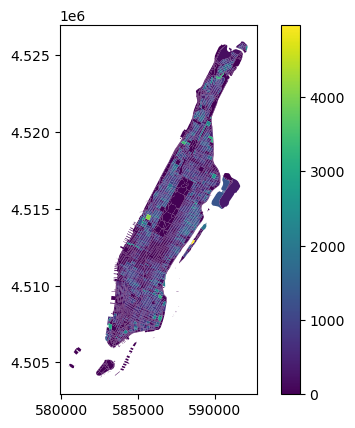

In [11]:
gdf.plot("POPN_TOTAL", legend=True)

And we can ask for a bigger map.

<Axes: >

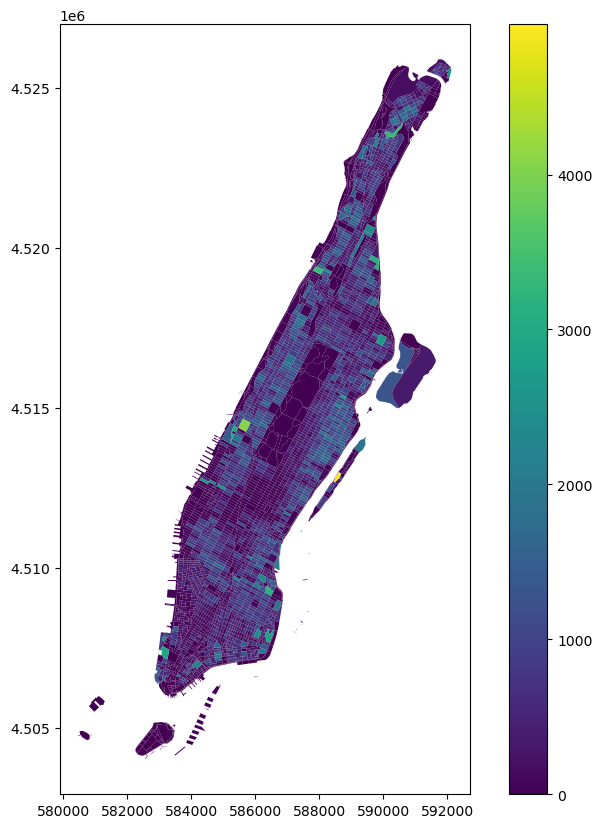

In [12]:
gdf.plot("POPN_TOTAL", legend=True, figsize=(10,10))

Alternatively, you can also explore your data interactively using `GeoDataFrame.explore()`, which behaves in the same way `plot()` does but returns an interactive map instead. These interactive maps are based in [Folium](https://python-visualization.github.io/folium/latest/) another library based on (Leaflet)[https://leafletjs.com/] 

But lets calculate population density first.

In [13]:
gdf["pop_density"] = gdf.apply(lambda row: row.POPN_TOTAL / row.area, axis=1)
gdf.explore("pop_density", legend=True)

Switching the active geometry (`GeoDataFrame.set_geometry`) to centroids, we can plot the same data using point geometry.

In [14]:
gdf = gdf.set_geometry("centroid")
gdf.explore("POPN_TOTAL", legend=True)

And we can also layer both `GeoSeries` on top of each other. We just need to use one plot as an axis for the other.

<Axes: >

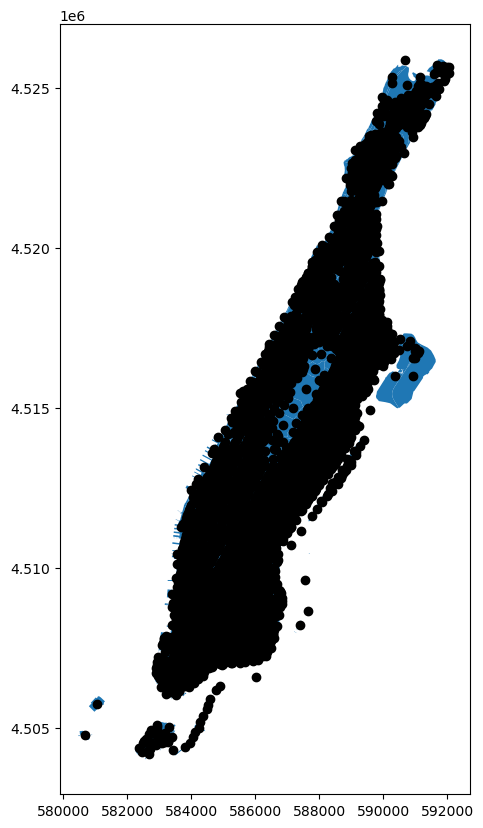

In [15]:
ax = gdf["geometry"].plot(figsize=(10,10))
gdf["centroid"].plot(ax=ax, color="black" )

And you can do something similar with **explore()**

In [34]:
m = gdf.explore("pop_density", legend=True)
gdf['centroid'].explore(m=m,color ="black")

# We can even add a layer control
import folium
folium.LayerControl().add_to(m)
m

Now we set the active geometry back to the original `GeoSeries`.

In [16]:
gdf = gdf.set_geometry("geometry")

<div class="alert alert-info">
User Guide
    
See more on [mapping in the User Guide](../docs/user_guide/mapping.rst).
</div>

## Geometry creation

We can further work with the geometry and create new shapes based on those we already have. 

### Convex hull

If we are interested in the convex hull of our polygons, we can access `GeoDataFrame.convex_hull`.

In [17]:

gdf["convex_hull"] = gdf.convex_hull

<Axes: >

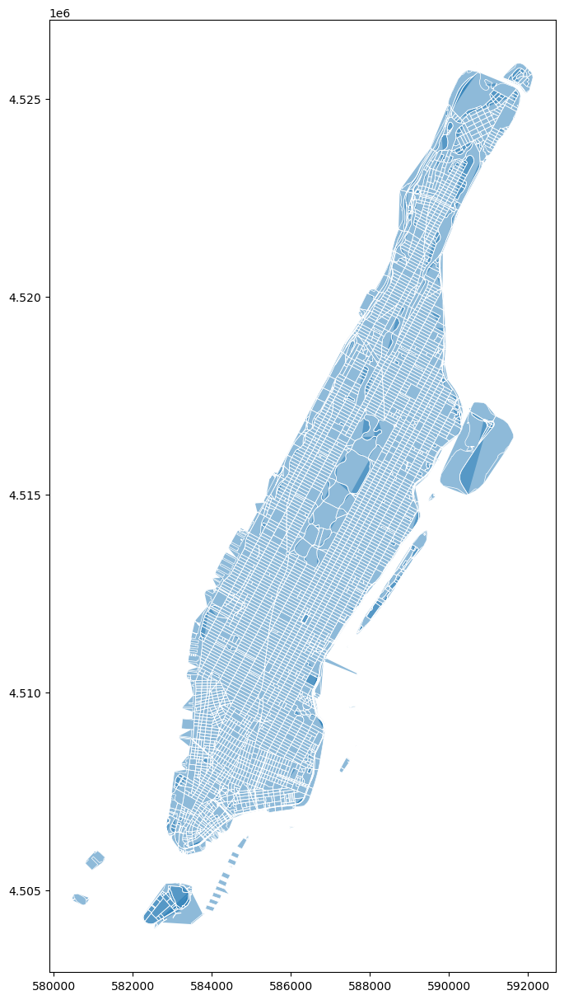

In [18]:
ax = gdf["convex_hull"].plot(alpha=.5, figsize=(15,15))  # saving the first plot as an axis and setting alpha (transparency) to 0.5
gdf["boundary"].plot(ax=ax, color="white", linewidth=.5)  # passing the first plot and setting linewitdth to 0.5

### Buffer

In other cases, we may need to buffer the geometry using `GeoDataFrame.buffer()`. Geometry methods are automatically applied to the active geometry, but we can apply them directly to any `GeoSeries` as well. Let's buffer the boroughs and their centroids and plot both on top of each other.

In [19]:
# buffering the active geometry by 100 meter (geometry is already in meter)
gdf["buffered"] = gdf.buffer(100)

# buffering the centroid geometry by 100 meter (geometry is already in meter)
gdf["buffered_centroid"] = gdf["centroid"].buffer(100)

<Axes: >

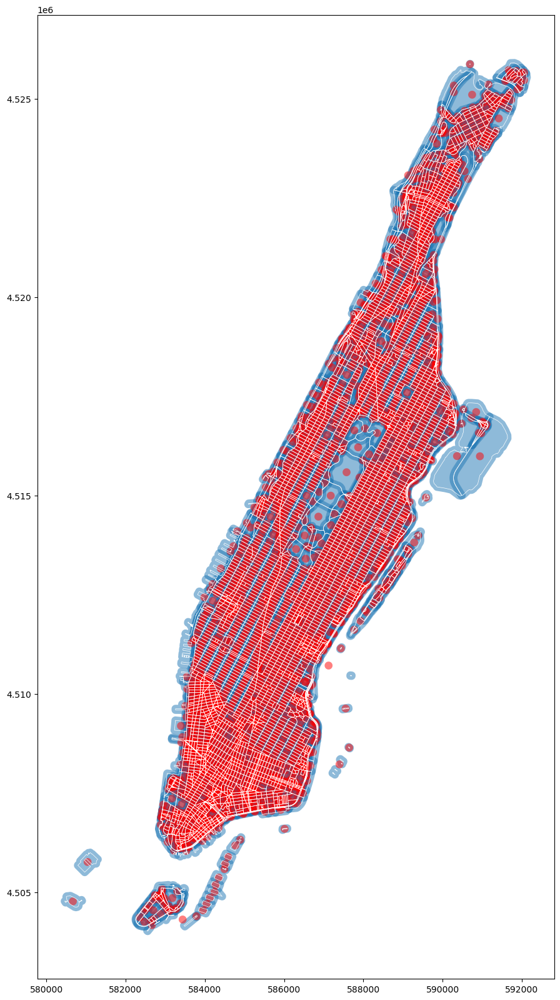

In [20]:
ax = gdf["buffered"].plot(alpha=.5, figsize=(20,20))  # saving the first plot as an axis and setting alpha (transparency) to 0.5
gdf["buffered_centroid"].plot(ax=ax, color="red", alpha=.5)  # passing the first plot as an axis to the second
gdf["boundary"].plot(ax=ax, color="white", linewidth=.5)  # passing the first plot and setting linewitdth to 0.5

   
## Geometry relations

We can also ask about the spatial relations of different geometries. Using the geometries above, we can check which of the buffered boroughs intersect the original geometry of Brooklyn, i.e., is within 100 meters from Brooklyn.

First, we get a polygon of the central park lake block.

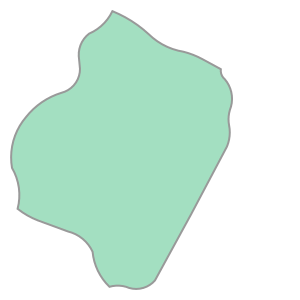

In [21]:
cp_lake = gdf.loc['360610143001013','geometry']
cp_lake

The polygon is a [shapely geometry object](https://shapely.readthedocs.io/en/stable/manual.html#geometric-objects), as any other geometry used in GeoPandas.

In [22]:
type(cp_lake)

shapely.geometry.polygon.Polygon

Then we can check which of the geometries in `gdf["buffered"]` intersects it.

In [23]:
gdf["buffered"].intersects(cp_lake.buffer(100))

BLKID
360610005000003    False
360610016001000    False
360610022011000    False
360610026021000    False
360610030011000    False
                   ...  
360610163005001    False
360610297001000    False
360610145001000    False
360610149001004    False
360610145003001    False
Length: 3856, dtype: bool

In [24]:
close_the_lake = gdf.loc[gdf["geometry"].intersects(cp_lake.buffer(100))]
close_the_lake.explore()


Alternatively, we can check which buffered centroids are entirely within the original boroughs polygons. In this case, both `GeoSeries` are aligned, and the check is performed for each row.

In [25]:
gdf["within"] = gdf["buffered_centroid"].within(gdf)
gdf["within"]

BLKID
360610005000003    False
360610016001000    False
360610022011000    False
360610026021000    False
360610030011000    False
                   ...  
360610163005001    False
360610297001000     True
360610145001000    False
360610149001004    False
360610145003001    False
Name: within, Length: 3856, dtype: bool

We can plot the results on the map to confirm the finding.

<Axes: >

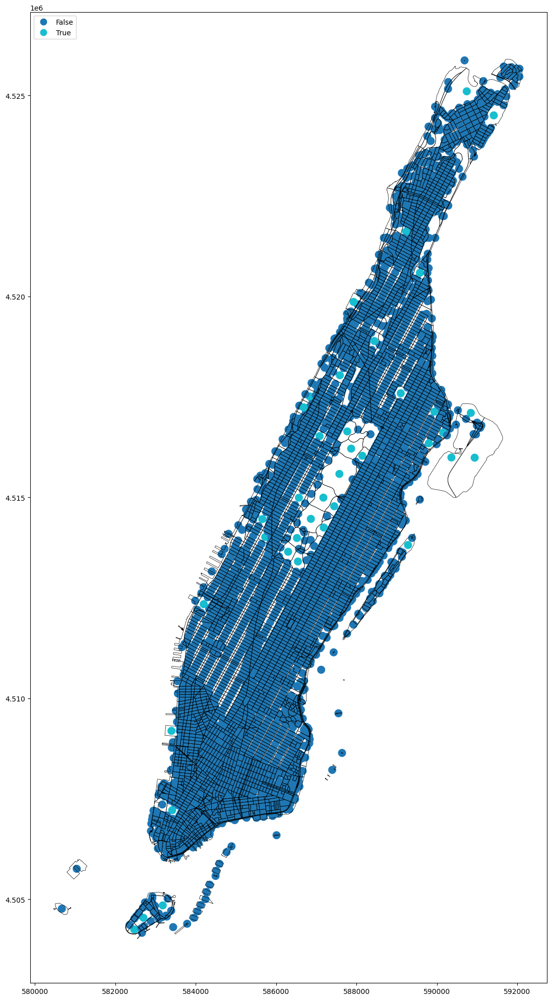

In [26]:
gdf = gdf.set_geometry("buffered_centroid")
ax = gdf.plot("within", legend=True, categorical=True, legend_kwds={'loc': "upper left"}, figsize=(25,25))  # using categorical plot and setting the position of the legend
gdf["boundary"].plot(ax=ax, color="black", linewidth=.5)  # passing the first plot and setting linewitdth to 0.5

## Projections

Each `GeoSeries` has its Coordinate Reference System (CRS) accessible at `GeoSeries.crs`. The CRS tells GeoPandas where the coordinates of the geometries are located on the earth's surface. In some cases, the CRS is geographic, which means that the coordinates are in latitude and longitude. In those cases, its CRS is WGS84, with the authority code `EPSG:4326`. Let's see the projection of our NY boroughs `GeoDataFrame`.

In [27]:
gdf.crs

<Projected CRS: EPSG:26918>
Name: NAD83 / UTM zone 18N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 78°W and 72°W - onshore and offshore. Canada - Nunavut; Ontario; Quebec. United States (USA) - Connecticut; Delaware; Maryland; Massachusetts; New Hampshire; New Jersey; New York; North Carolina; Pennsylvania; Virginia; Vermont.
- bounds: (-78.0, 28.28, -72.0, 84.0)
Coordinate Operation:
- name: UTM zone 18N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

Geometries are in `EPSG:26918` with coordinates in meters. We can easily re-project a `GeoSeries` to another CRS, like `EPSG:4326` using `GeoSeries.to_crs()`.

<Axes: >

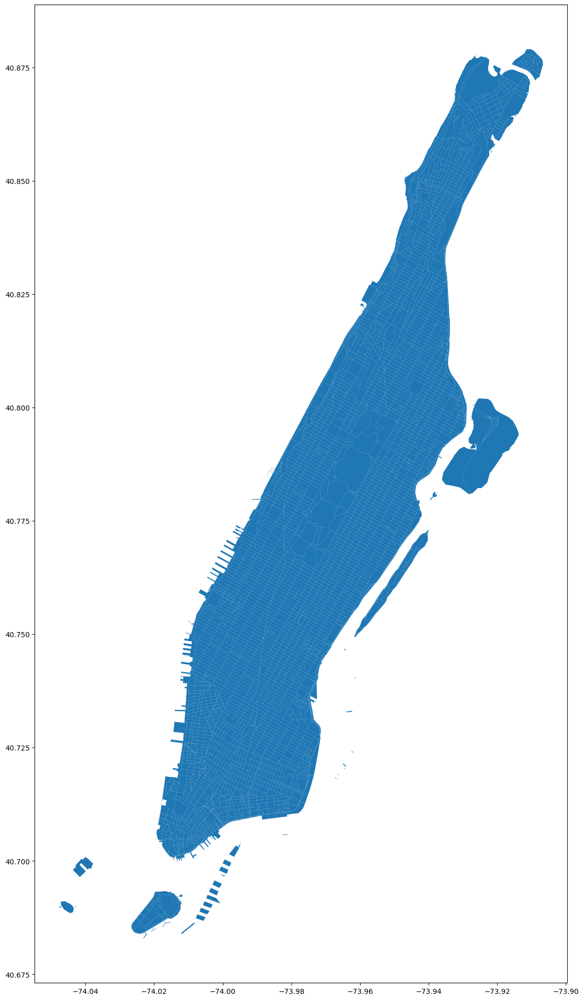

In [28]:
gdf = gdf.set_geometry("geometry")
blocks_4326 = gdf.to_crs("EPSG:4326")
blocks_4326.plot(figsize=(25,25))

In [29]:
blocks_4326.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Notice the difference in coordinates along the axes of the plot. Where we had 5 800 000 - 4 505 000 (meters) before, we now have 40.5 - 70.04 (degrees). In this case, `blocks_4326` has a `"geometry"` column in WGS84 but all the other (with centroids etc.) remain in the original CRS.

<div class="alert alert-warning">
Warning
    
For operations that rely on distance or area, you always need to use a projected CRS (in meters, feet, kilometers etc.) not a geographic one (in degrees). GeoPandas operations are planar, whereas degrees reflect the position on a sphere. Therefore, spatial operations using degrees may not yield correct results. For example, the result of `gdf.area.sum()` (projected CRS) is 8 429 911 572 ft<sup>2</sup> but the result of `boroughs_4326.area.sum()` (geographic CRS) is 0.083.
</div>

<div class="alert alert-info">
User Guide
    
See more on [projections in the User Guide](https://geopandas.org/en/stable/docs/user_guide/projections.html).
</div>

## What next?

With GeoPandas we can do much more than what has been introduced so far, from [aggregations](https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html), to [spatial joins](https://geopandas.org/en/stable/docs/user_guide/mergingdata.html), to [geocoding](https://geopandas.org/en/stable/docs/user_guide/geocoding.html), and [much more](https://geopandas.org/en/stable/gallery/index.html).